In [1]:
library(FactoMineR)

## IMPORTATION DES DONNEES

In [2]:
def = read.csv('./Donnees/Plusieurs_pays/Defensive.csv', header = TRUE)

In [3]:
pas_complet = read.csv('./Donnees/Plusieurs_pays/Passing.csv', header = TRUE)

In [4]:
of = read.csv('./Donnees/Plusieurs_pays/Offensive.csv', header = TRUE)

## ANALYSE DE LA VARIABLE RATING

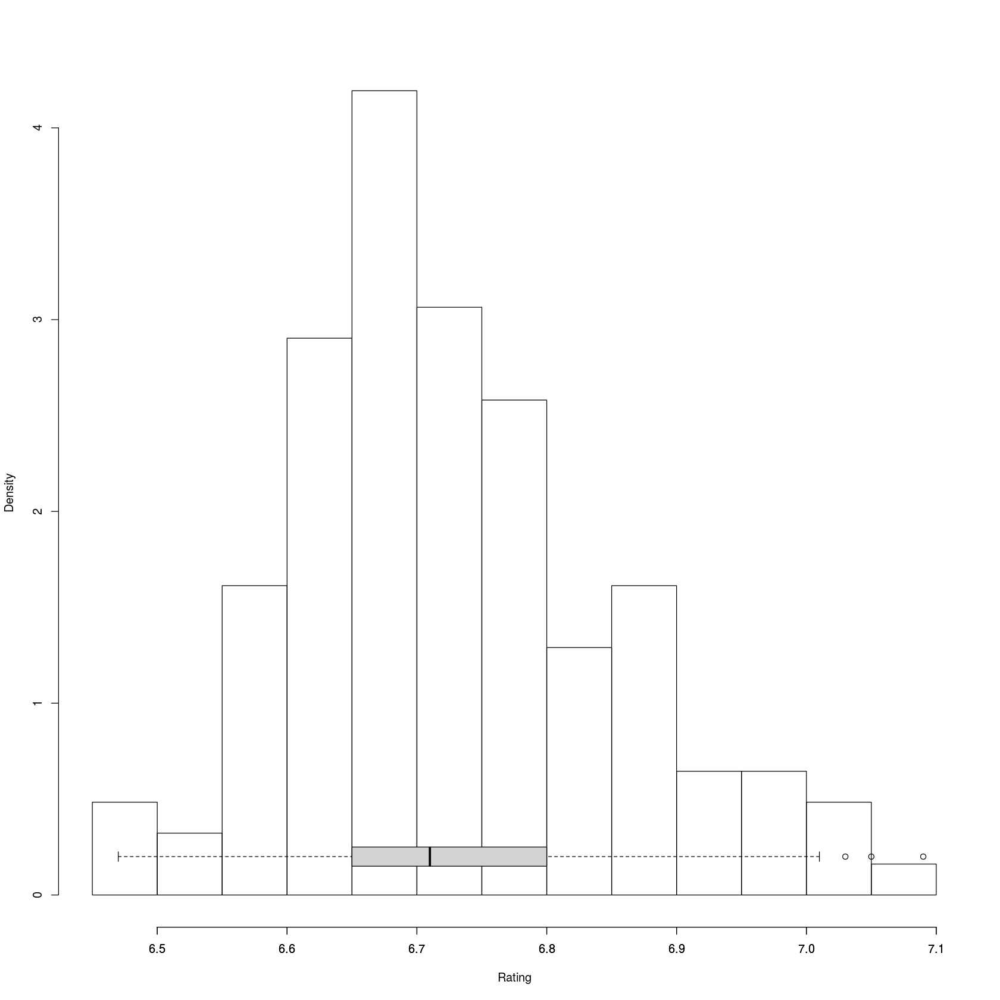

In [5]:
# Analyse descriptive de la variable Rating
options(repr.plot.width=14, repr.plot.height=14)
hist(def$Rating, breaks = 10, probability=T, main="", xlab="Rating", )
boxplot(def$Rating, horizontal=TRUE, boxwex=.2,  outline=TRUE,  
        frame=F, col = "lightgrey", add = TRUE, at=0.2)

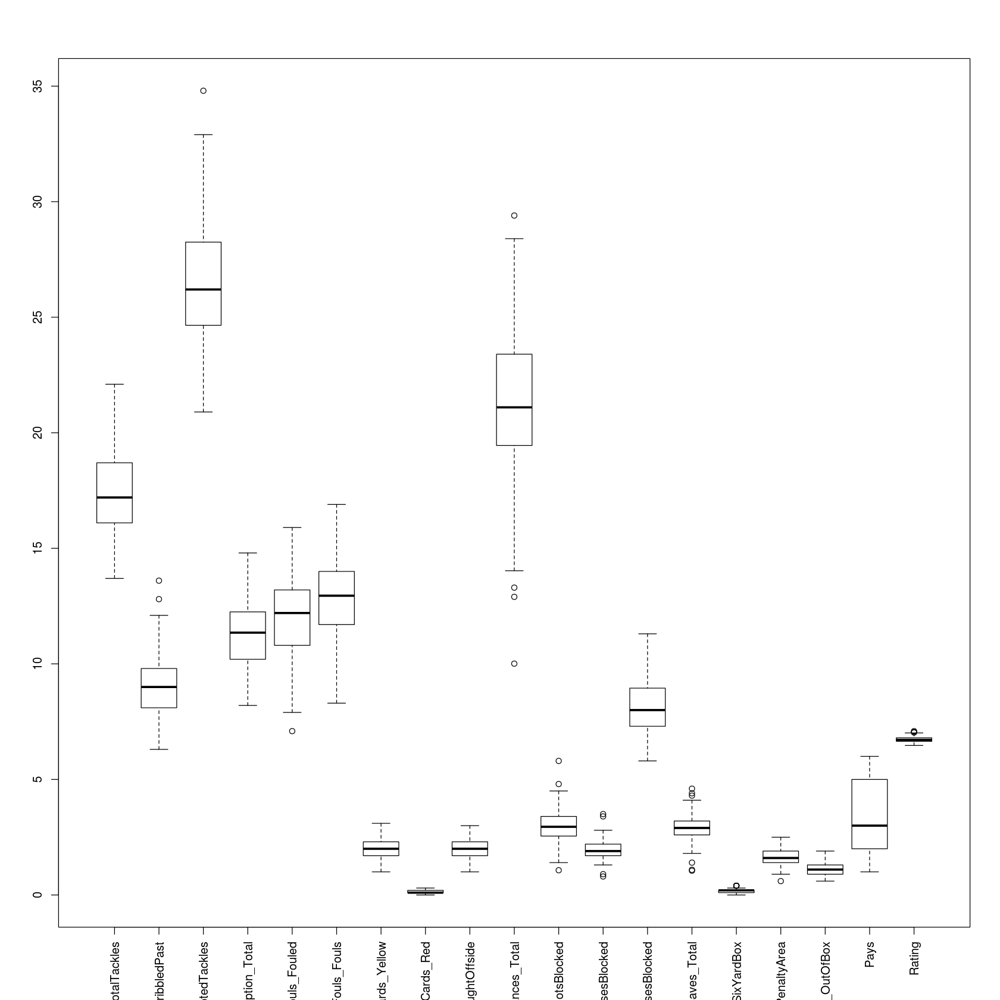

In [6]:
boxplot(def, las = 3)

La répartition de la variable `Rating` est légèrement asymétrique (médiane non centrée). On ne détecte qu'un seul outlier : c'est plutôt bon signe.

## ANALYSE DESCRIPTIVE DONNEES DEFENSIVE

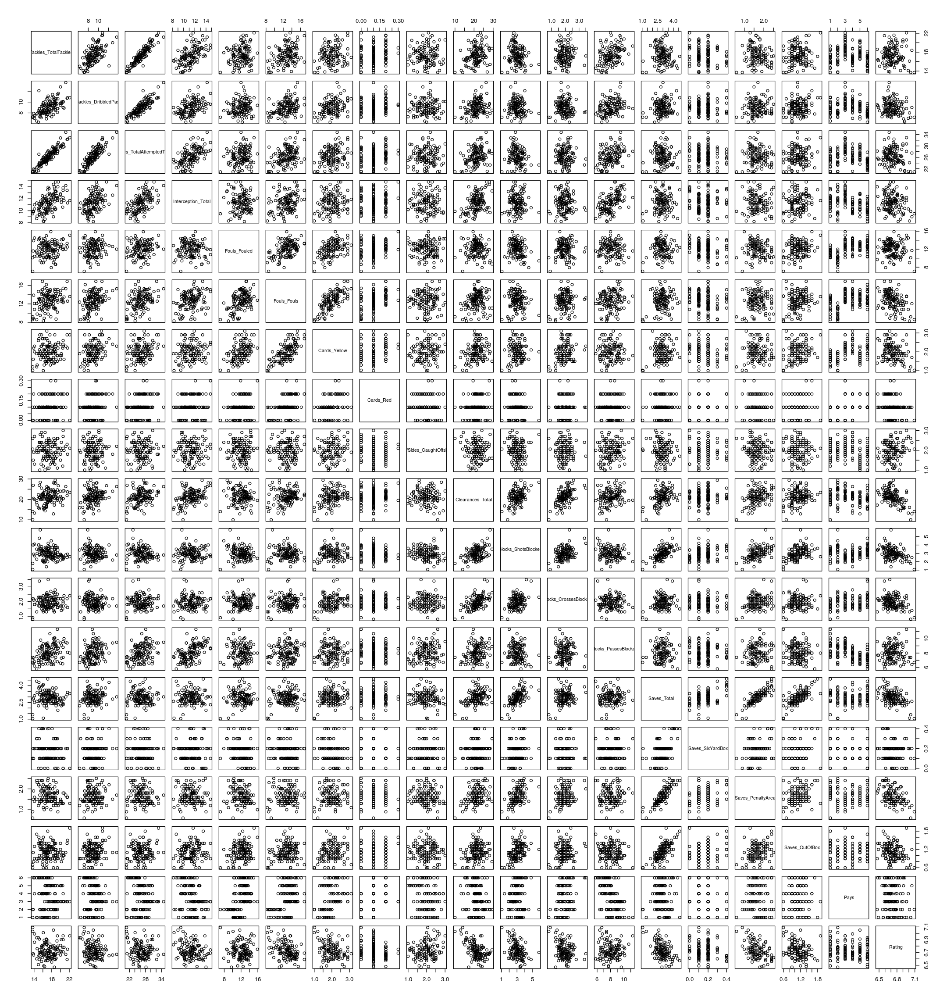

In [7]:
options(repr.plot.width=18, repr.plot.height=19)
pairs(def)

Ce qui nous intéresse c'est les variables corrélées avec la variable `Rating`. Au vu du scatter matrix, la variable `Clearances_Total` est corrélée linéairement. Les variables `Fouls_Fouls` et `Interception_Total` semblent un peu corrélées. Des classes apparaissent avec les variables `Cards_Red`, `Saves_SixYardsBox`, `Saves_OutOfBox`.

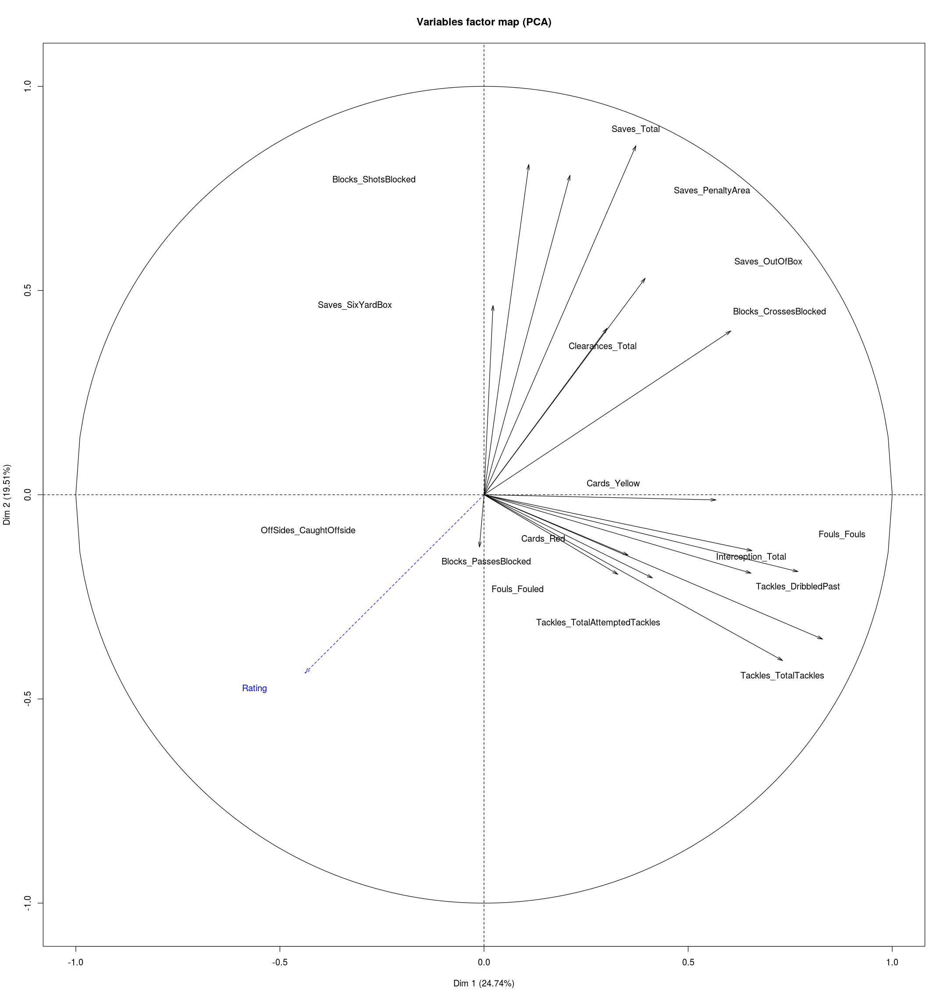

In [9]:
pca=PCA(def,scale.unit=T,graph=F, quanti.sup = 19, quali.sup = 18)
plot(pca, axes = c(1,2), choix="var")

Pour l'ACP des dimensions 1 et 2 (pour seulement 44% de l'information), on remarque que `Rating` est corrélé négativement avec `Clearances`. On voit aussi que dans ce plan, il ne semble pas y avoir de relations entre le nombre de cartons, jaunes ou rouge, ou la quantité de tacles avec la variable `Rating`.

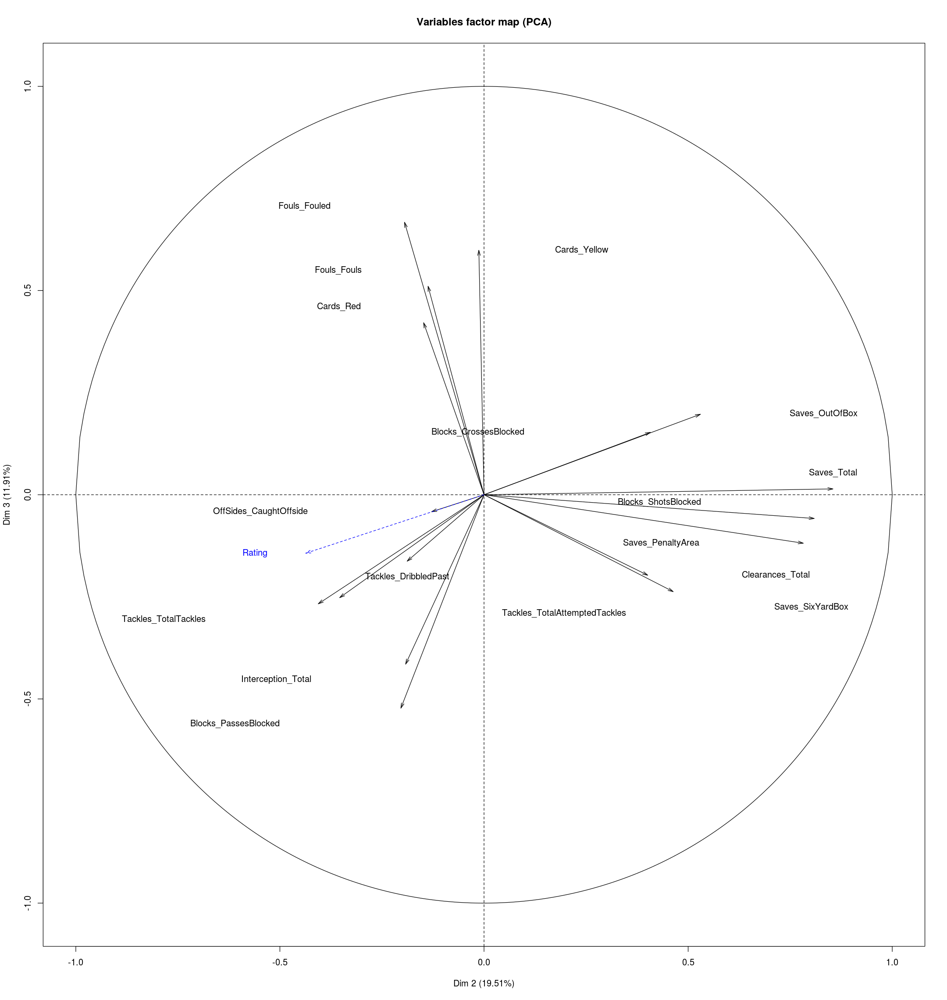

In [10]:
plot(pca, axes = c(2,3), choix="var")

Dans ce plan, les tacles sont très mal expliqués. On peut donc penser que l'information contenue à leur sujet dans le premier plan est suffisante pour affirmer qu'ils n'influent pas la variable `Rating`. On voit que la variable `Clearance` est toujours très corrélée négativement.  
Dans ce plan, la variable `Fouls_Fouls` (=fautes effectuées par notre équipe) est négativement corrélée avec `Rating`.

## ANALYSE DESCRIPTIVE DONNEES PASSING

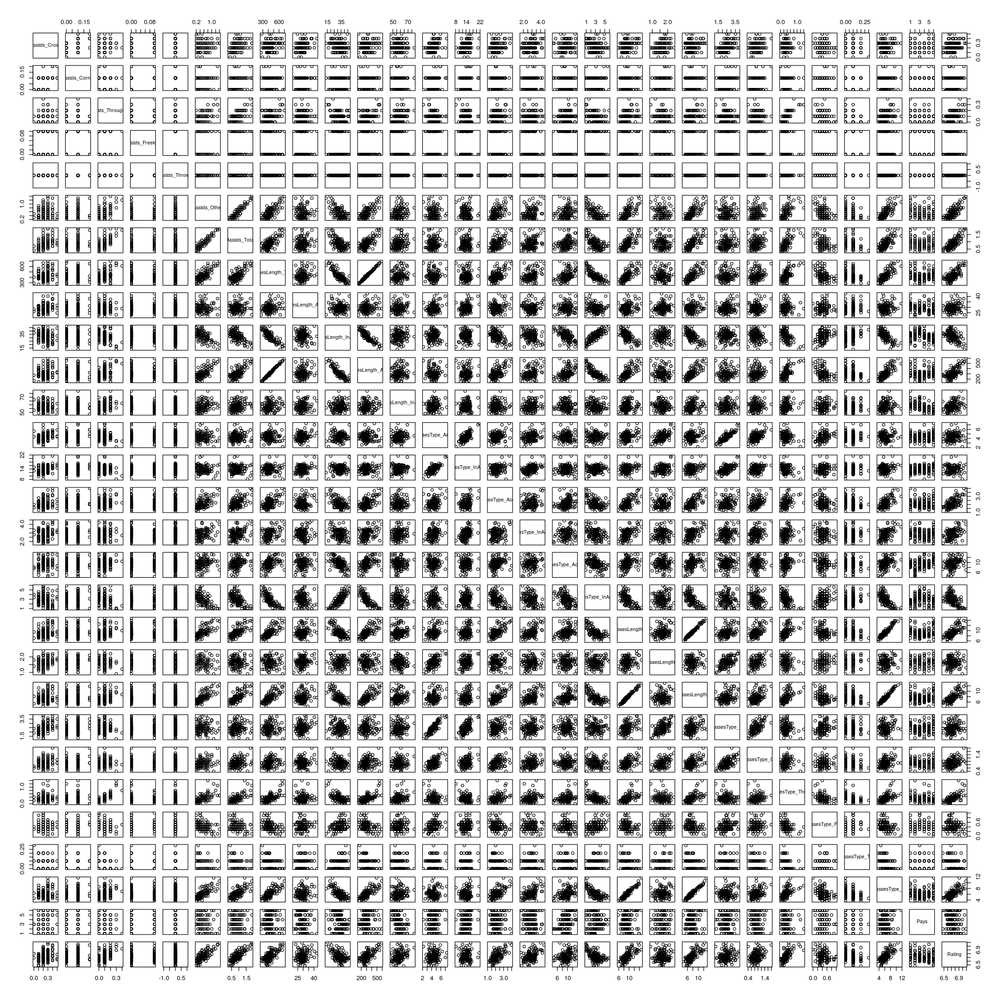

In [12]:
options(repr.plot.width=18, repr.plot.height=18)
pairs(pas_complet)

Les variables `PassesLength_Total`, `PassesType_Other`, `KeyPassesLength_Short`, `Assists_Other` et `Assists_Total` sont corrélées linéairement avec la variable à expliquer `Rating`.

In [13]:
pas = pas_complet[-c(5)]
pas

,Assists_Cross,Assists_Corner,Assists_Throughball,Assists_Freekick,Assists_Other,Assists_Total,PassesLength_Total,PassesLength_AccLB,PassesLength_InAccLB,PassesLength_AccSP,⋯,KeyPassesLength_Long,KeyPassesLength_Short,KeyPassesType_Cross,KeyPassesType_Corner,KeyPassesType_Throughball,KeyPassesType_Freekick,KeyPassesType_Throwin,KeyPassesType_Other,Pays,Rating
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
Paris Saint-Germain,0.3,0.1,0.3,0.0,1.3,1.9,621.3,23.1,13.1,529.2,⋯,1.7,9.4,2.1,1.0,1.1,0.1,0.1,7.9,France,7.05
Lyon,0.3,0.0,0.2,0.0,0.9,1.4,548.6,26.1,19.6,445.2,⋯,2.2,10.8,3.0,1.1,0.6,0.4,0.0,9.2,France,6.91
Lille,0.2,0.1,0.2,0.1,0.8,1.3,438.1,23.9,29.8,331.3,⋯,1.7,8.4,2.5,1.0,0.7,0.5,0.0,6.7,France,6.84
Montpellier,0.2,0.1,0.1,0.0,0.4,0.7,416.7,36.2,31.6,291.1,⋯,1.7,8.0,2.9,0.8,0.3,0.5,0.2,6.1,France,6.81
Saint-Etienne,0.5,0.1,0.1,0.1,0.5,1.1,453.9,31.8,32.8,336.1,⋯,1.8,7.9,2.5,1.1,0.3,0.4,0.1,6.6,France,6.78
Marseille,0.3,0.1,0.1,0.0,0.8,1.2,473.7,26.6,27.2,363.6,⋯,1.8,8.9,3.6,1.4,0.4,0.6,0.0,6.3,France,6.78
Nice,0.1,0.0,0.0,0.1,0.3,0.5,521.6,27.6,24.1,420.9,⋯,1.7,7.0,1.9,1.0,0.3,0.5,0.0,6.2,France,6.76
Nimes,0.4,0.2,0.1,0.1,0.4,1.0,358.7,27.5,35.8,239.3,⋯,1.9,7.7,2.7,1.3,0.3,0.5,0.1,6.3,France,6.75
Rennes,0.2,0.1,0.0,0.0,0.7,0.9,424.2,27.0,27.2,317.4,⋯,1.8,6.8,2.0,0.6,0.2,0.3,0.0,6.2,France,6.73


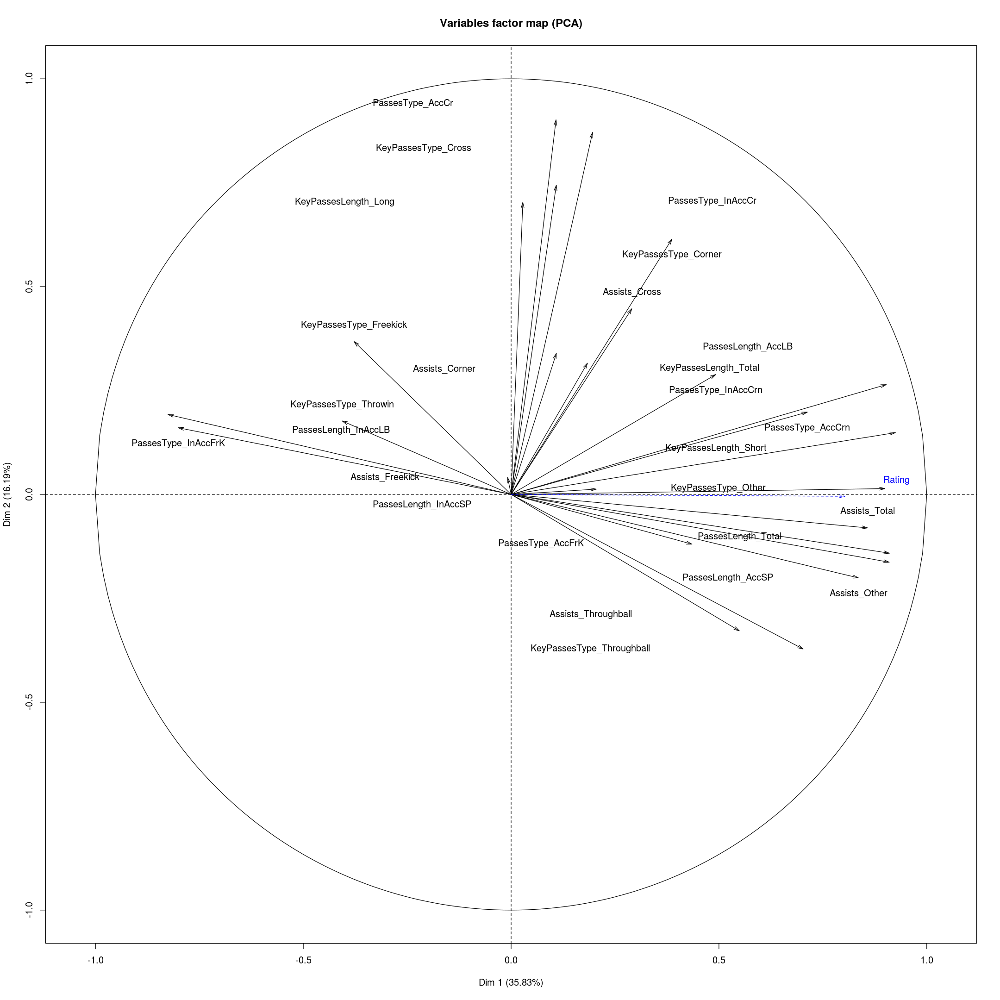

In [14]:
pca = PCA(pas, scale.unit=T, graph=F, quali.sup = 27, quanti.sup = 28)
plot(pca, axes = c(1,2), choix="var")

Ces deux dimenssions expliquent plutôt bien les variables : 60.9% de l'inforation est contenue dans les deux premiers axes.  

La variable `Rating` semble très fortement corrélée à la variable `assists_others` qui représente les passes décisives autres. Les variables `PassesLength_AccSP`, `PassesLength_Total` et `PassesType_AccFrK` qui représentent respectivement les passes courtes réussies, le total du nombre de passes et le nombre de coups francs réussis.  
Les variables `KeyPassesType_Freekick` et `KeyPassesType_Throwing` qui représentent respectivement les passes clés sur un coup franc et les passes clés sur une touche sont corrélées négativement.  
Les variables `PassesType_AccCr` et `PassesType_InAccCrn` qui représentent respectivement les passes centre réussies et le nombre de corners râtés n'influent pas sur la variable `Rating`.

## ANALYSE DESCRIPTIVE DONNEES OFFENSIVES

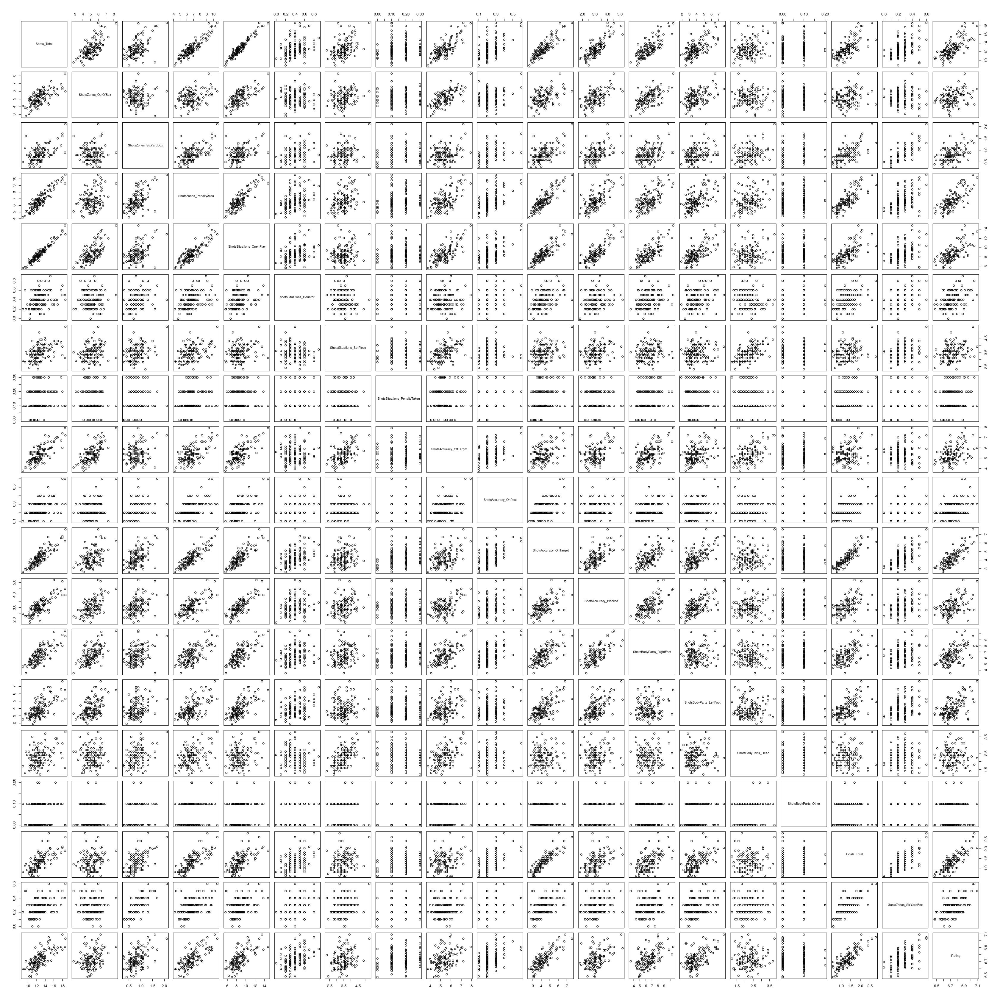

In [17]:
options(repr.plot.width=28, repr.plot.height=28)
pairs(of[c(1:18, 40)])

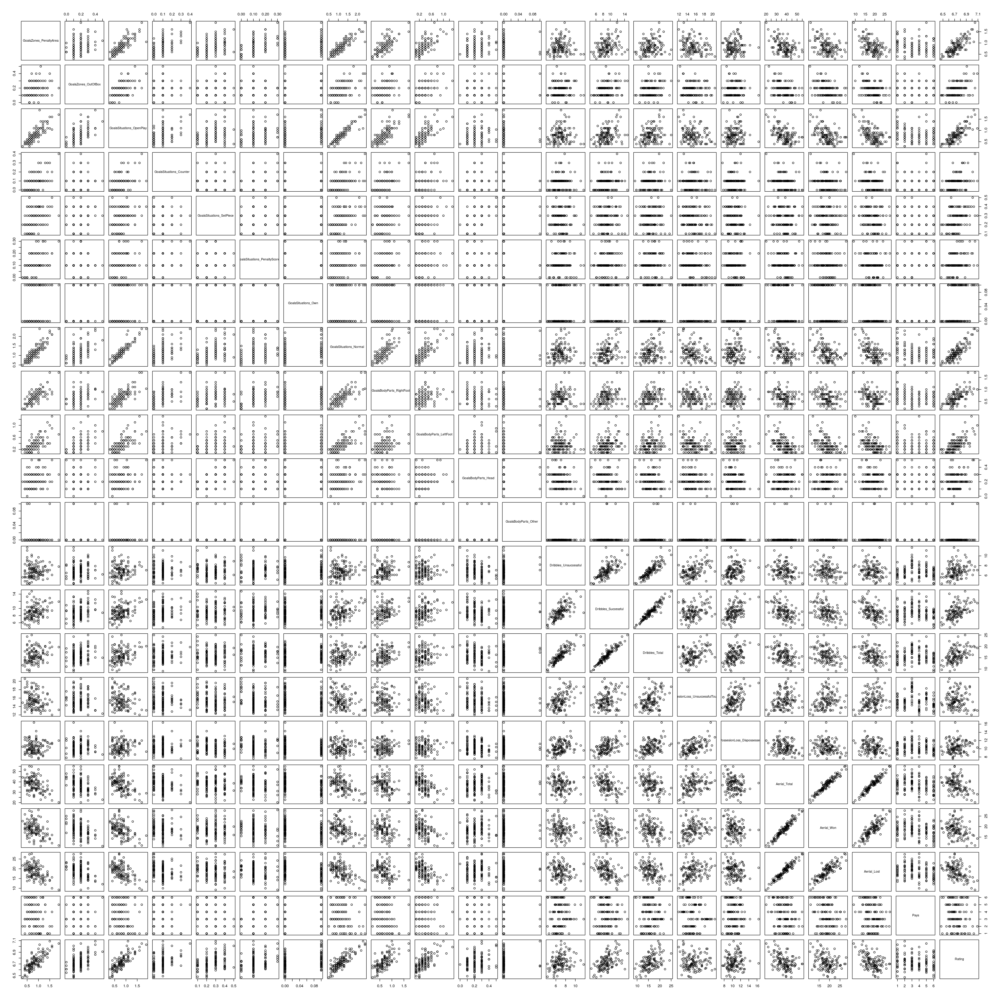

In [18]:
options(repr.plot.width=28, repr.plot.height=28)
pairs(of[19:40])

Les variables `ShotsZones_PenaltyArea`, `Shots_Total`, `ShotsSituations_OpenPlay`, `ShotsAccuracy_OnTarget`, `ShotsBodyParts_Total`, `Goals_Total`, `GoalsSituations_OpenPlay`, `GoalsSituations_Normal` sont corrélées linéairement avec la variable à expliquer `Rating`.  
Les variables `Aerial_Lost` et `Aerial_Total` sont corrélées linéairement négativement.

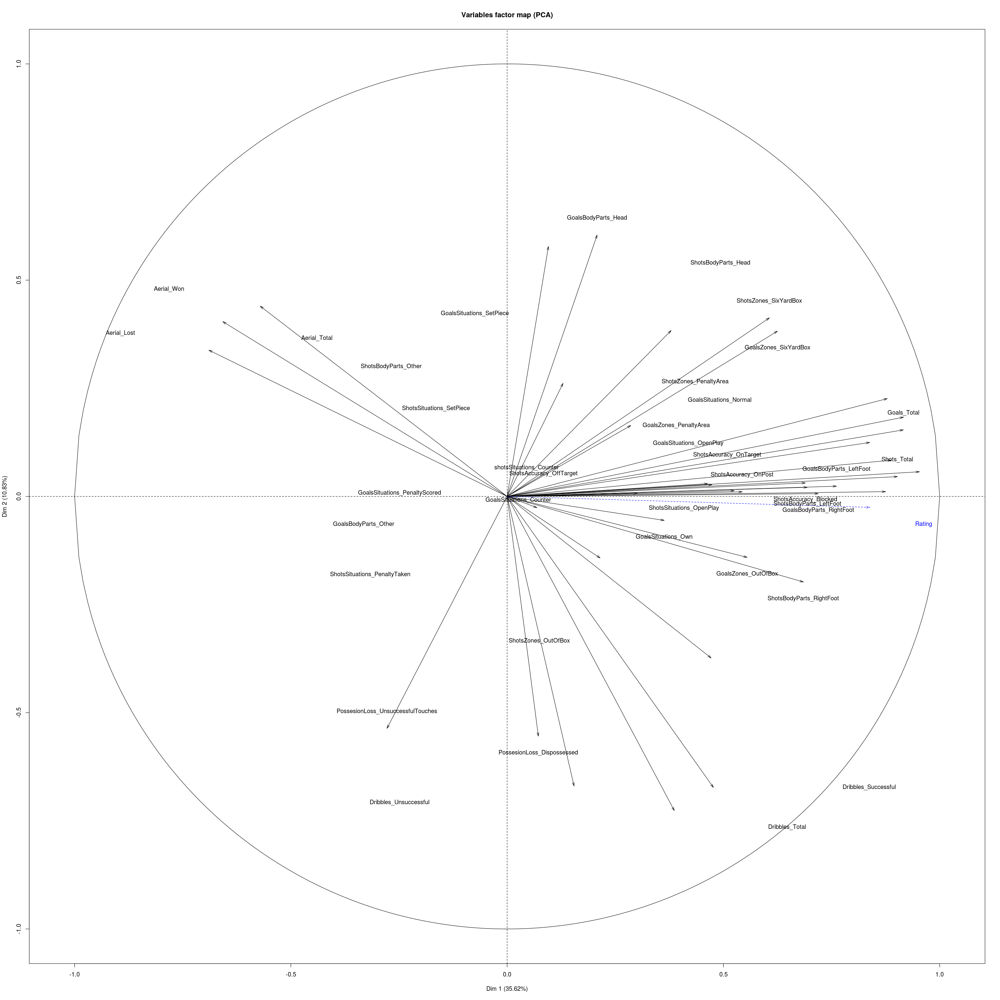

In [19]:
pca = PCA(of, scale.unit=T, graph=F, quali.sup = 39, quanti.sup = 40)
plot(pca, axes = c(1,2), choix="var")

In [20]:
pca$var$coord

,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5
Shots_Total,0.8930438,0.38331258,-0.169362312,-0.0217231339,-0.064088045
ShotsZones_OutOfBox,0.3696476,0.52420890,-0.529425300,-0.1426641839,-0.232401133
ShotsZones_SixYardBox,0.7206944,0.28555512,0.171306758,0.1876858079,0.324761235
ShotsZones_PenaltyArea,0.9229077,0.19401823,0.008136052,0.0009263496,-0.039566771
ShotsSituations_OpenPlay,0.8733807,0.30916446,-0.144980250,-0.2030665905,-0.112878149
shotsSituations_Counter,0.6211085,-0.18633300,-0.068708400,0.0213624091,0.375312334
ShotsSituations_SetPiece,0.5058065,0.61382118,-0.191418484,0.3448154238,-0.090737989
ShotsSituations_PenaltyTaken,0.4055843,-0.17608863,-0.091584540,0.4725938057,0.131897473
ShotsAccuracy_OffTarget,0.6277185,0.49399431,-0.327372096,0.0350961976,-0.215581370
ShotsAccuracy_OnPost,0.6489967,-0.01078262,0.017819515,0.3632149760,0.046490215


In [21]:
pca$quanti.sup$coord

,Dim.1,Dim.2,Dim.3,Dim.4,Dim.5
Rating,0.9349207,-0.07273178,0.05196235,-0.03199768,-0.06800659


Cette ACP porte 60% de l'information sur ses deux premiers axes.  

Les variables `Goals_Total`, `GoalsSituations_OpenPlay`, `GoalsSituations_Normal`, `GoalsZones_PenaltyArea`, `GoalsBodyParts_RightFoot` sont corrélées positivement avec la variable `Rating`.  
Les variables liées aux duels aériens (`Aerial_Won`, `Aerial_Lost` et `Aerial_Total`) sont corrélées négativement à la variable `Rating`.  
Les variables `Dribbles_Unsuccessful`, `ShotsZones_OutOfBox`, `ShotsSituations_SetPiece`, `ShotsAccuracy_Blocked`, `ShotsBodyParts_Head` ne sont pas corrélées avec la variables `Rating`.

## CREATION D'UN DATAFRAME REGROUPANT LES VARIABLES QUI NOUS SEMBLENT LES PLUS PERTINANTES

In [22]:
data_complet = data.frame(def$Rating, def$Clearances_Total, def$Interception_Total, def$Fouls_Fouls, 
                  pas$PassesLength_Total, pas$KeyPassesType_Other, pas$KeyPassesLength_Short, 
                  pas$Assists_Other, pas$Assists_Total, pas$PassesLength_AccSP, pas$PassesType_AccFrK, 
                  pas$KeyPassesType_Freekick, pas$KeyPassesType_Throwin, of$ShotsZones_PenaltyArea, 
                  of$Shots_Total, of$ShotsSituations_OpenPlay, of$ShotsAccuracy_OnTarget, 
                  of$Goals_Total, of$GoalsSituations_OpenPlay, 
                  of$GoalsSituations_Normal, of$Aerial_Lost, of$Aerial_Total, of$Aerial_Won)

In [23]:
rownames(data_complet) =  rownames(def)

In [24]:
print.data.frame(data_complet)

                         def.Rating def.Clearances_Total def.Interception_Total
Paris Saint-Germain_2019       7.05                 12.9                   9.00
Lyon_2019                      6.91                 16.1                   9.60
Lille_2019                     6.84                 17.9                  10.20
Montpellier_2019               6.81                 18.6                  12.80
Saint-Etienne_2019             6.78                 19.3                  11.60
Marseille_2019                 6.78                 17.0                  10.60
Nice_2019                      6.76                 19.3                  11.80
Nimes_2019                     6.75                 20.4                  11.70
Rennes_2019                    6.73                 19.2                  10.20
Strasbourg_2019                6.73                 18.4                  11.30
Reims_2019                     6.72                 21.5                  12.80
Nantes_2019                    6.71     

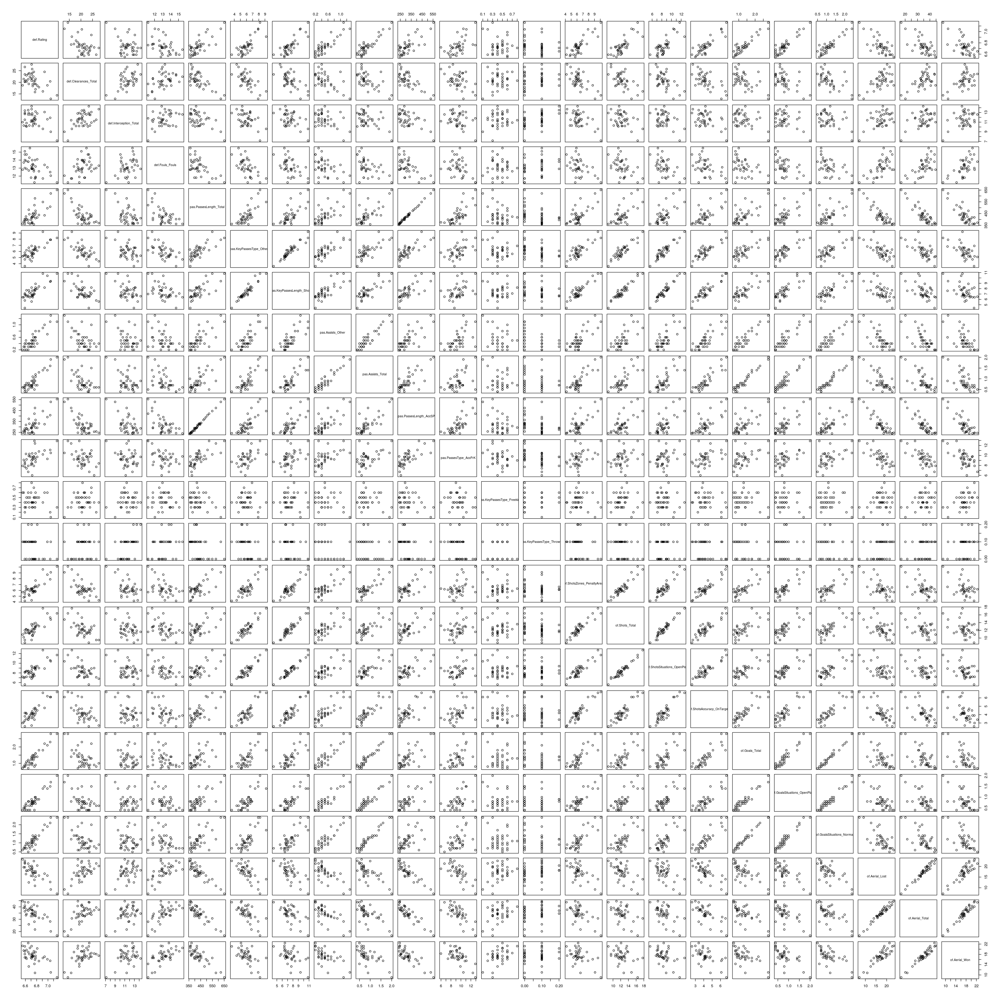

In [25]:
options(repr.plot.width=28, repr.plot.height=28)
pairs(data_complet)

De par le scatter plot, on peut voir que les variables `PassesLength_Total` et `PassesLength_AccSP` sont très corrélées linéairement. On peut penser qu'elles sont redondantes.

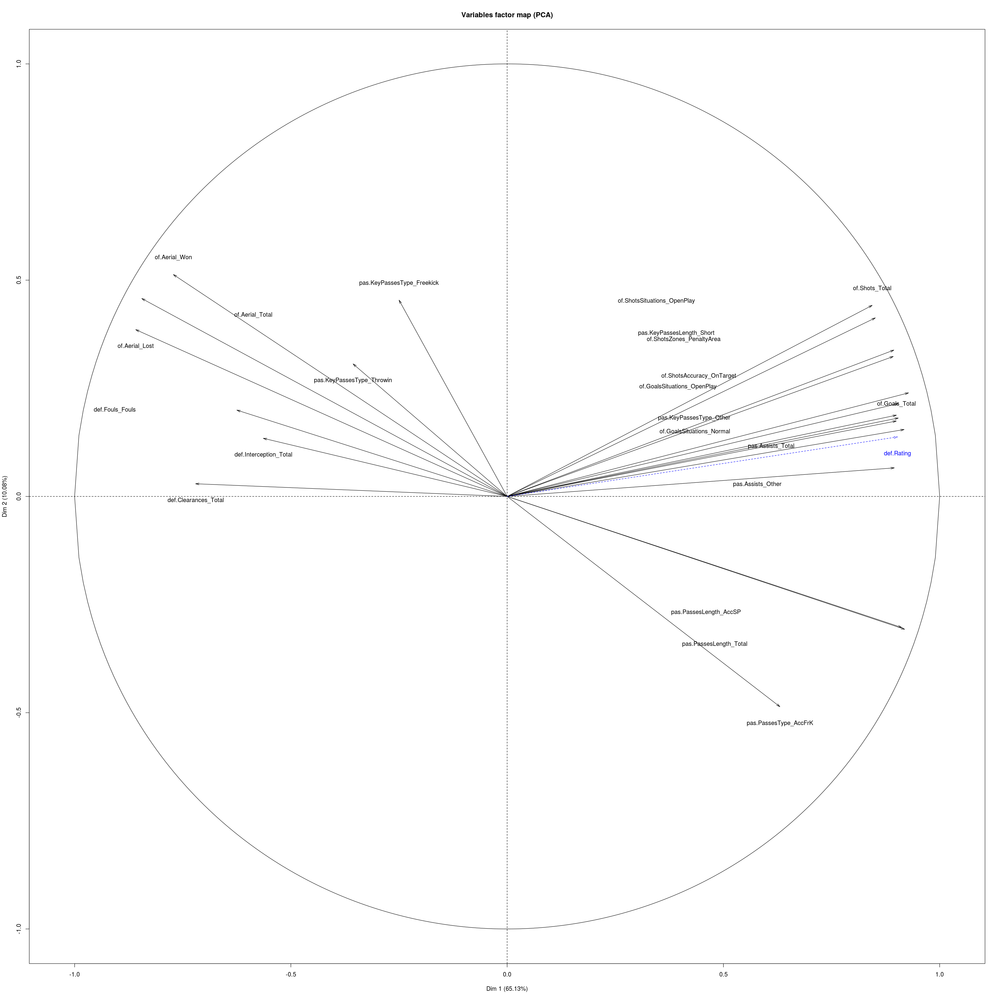

In [26]:
pca = PCA(data_complet, scale.unit=T, graph=F, quanti.sup = 1)
plot(pca, axes = c(1,2), choix="var")

Avec l'ACP, on peut confirmer que les variables `PassesLength_Total` et `PassesLength_AccSP` sont redondantes. On va faire le choix de ne garder que la variable `passesLength_Total` pour garder le plus d'informations possible.

In [27]:
data = data_complet[-c(10)]

In [28]:
pca = PCA(data, scale.unit=T, quanti.sup = 1)

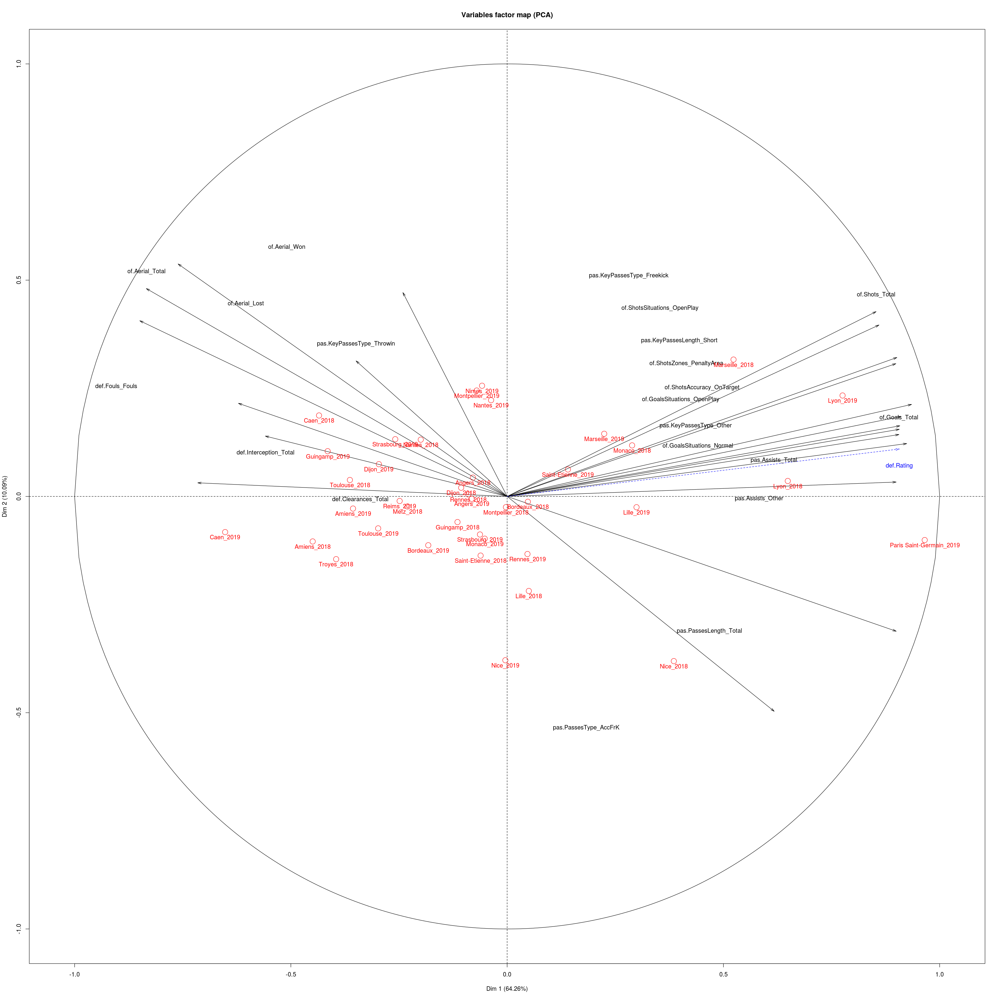

In [29]:
plot(pca, choix='var')
points(pca$ind$coord/9.5, col='red', cex=2)
text(pca$ind$coord/9.5, labels = rownames(pca$ind$coord), col = "red", pos=1)